In [1]:
import pandas as pd
from sklearn import metrics
import glob
from sklearn.model_selection import train_test_split
import seaborn as sn
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report

<h3>Loading Dataset</h3>

In [2]:
path = '../Dataset/Train/'
train_data = pd.read_csv(path+'balanced_34_class_over_undersampled_train.csv')
train_data.head()
train_data['label'] = train_data['label'].replace(0, 34)

In [3]:
train_data['label'].value_counts()

label
22    60000
28    60000
17    50000
10    50000
25    50000
26    50000
27    50000
29    50000
9     50000
8     50000
30    50000
6     50000
5     50000
4     50000
3     50000
19    40000
31    40000
20    40000
34    40000
18    40000
16    40000
15    40000
14    40000
32    35000
33    35000
1     30000
12    30000
11    30000
21    25000
23    15000
13    15000
24    10000
7     10000
2     10000
Name: count, dtype: int64

In [4]:
len(train_data)

1335000

In [3]:
path = '../Dataset/Test/'
test_data = pd.read_csv(path+'testing_34.csv')
test_data.head()
test_data['label'] = test_data['label'].replace(0, 34)

In [5]:
test_data['label'].value_counts()

label
3     1438346
10    1083949
9      898784
4      819001
6      812659
5      808686
8      721032
16     664465
15     534381
14     404587
34     219882
31     197798
33     177278
32     150386
12      90881
18      61627
11      57729
1       57001
19      35591
20      26992
21      19390
23      16607
13      14241
24       7441
2        5727
7        4783
17       2561
30       1245
26       1167
25       1035
29        767
27        563
22        481
28        253
Name: count, dtype: int64

<h3>Train and Test split</h3>

In [6]:
# feature_cols = data.columns.to_list()[:-1]
# X = data[feature_cols] #Features
# y = data.label #target

In [7]:
# X_train,y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

<h3>Data Preprocessing</h2>

In [4]:
X_train = train_data.drop(columns='label',axis=1).to_numpy()
X_test = test_data.drop(columns='label',axis=1).to_numpy()

<h2>Using D-Tree Classifier

In [6]:
from sklearn.tree import DecisionTreeClassifier

In [7]:
clf = DecisionTreeClassifier(max_depth=33,class_weight='balanced')

clf.fit(X_train,train_data['label'])

DecisionTreeClassifier(class_weight='balanced', max_depth=33)

In [8]:
predicted = clf.predict(X_test)

In [9]:
print(metrics.accuracy_score(test_data['label'], predicted))
print(classification_report(test_data['label'], predicted))

0.9914370467916048
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     57001
           2       0.96      0.99      0.98      5727
           3       1.00      1.00      1.00   1438346
           4       1.00      1.00      1.00    819001
           5       1.00      1.00      1.00    808686
           6       1.00      1.00      1.00    812659
           7       0.98      1.00      0.99      4783
           8       1.00      1.00      1.00    721032
           9       1.00      1.00      1.00    898784
          10       1.00      1.00      1.00   1083949
          11       1.00      1.00      1.00     57729
          12       1.00      1.00      1.00     90881
          13       0.99      1.00      0.99     14241
          14       1.00      1.00      1.00    404587
          15       1.00      1.00      1.00    534381
          16       1.00      1.00      1.00    664465
          17       0.24      0.70      0.36      2561
        

In [10]:
print(metrics.accuracy_score(test_data['label'], predicted))
print(metrics.precision_score(test_data['label'], predicted, average='weighted'))
print(metrics.recall_score(test_data['label'], predicted, average='weighted'))
print(metrics.f1_score(test_data['label'], predicted, average='weighted'))

0.9914370467916048
0.9945911165761695
0.9914370467916048
0.9927116720594176


In [17]:
tpr = metrics.recall_score(test_data['label'], predicted, average='micro')
tnr = metrics.recall_score(test_data['label'], predicted, average='micro') 
fpr = 1 - tnr
fnr = 1 - tpr

print(fpr,fnr)

0.008932331303770802 0.008932331303770802


In [5]:
category_dict = {
        'DDoS-ACK_Fragmentation' : 1,
        'DDoS-HTTP_Flood' : 2,
        'DDoS-ICMP_Flood': 3,
        'DDoS-PSHACK_Flood': 4,
        'DDoS-RSTFINFlood': 5,
        'DDoS-SYN_Flood': 6,
        'DDoS-SlowLoris': 7,
        'DDoS-SynonymousIP_Flood': 8,
        'DDoS-TCP_Flood': 9,
        'DDoS-UDP_Flood': 10,
        'DDoS-UDP_Fragmentation': 11,
        'DDoS-ICMP_Fragmentation' : 12,

        'DoS-HTTP_Flood' : 13,
        'DoS-SYN_Flood' : 14,
        'DoS-TCP_Flood' : 15,
        'DoS-UDP_Flood' : 16,

        'DictionaryBruteForce' : 17,

        'MITM-ArpSpoofing' : 18,
        'DNS_Spoofing' : 19,

        'Recon-HostDiscovery' : 20,
        'Recon-OSScan' : 21,
        'Recon-PingSweep' : 22,
        'Recon-PortScan' : 23,
        'VulnerabilityScan' : 24,

        'SqlInjection' : 25,
        'CommandInjection' : 26,
        'Backdoor_Malware' : 27,
        'Uploading_Attack' : 28,
        'XSS' : 29,
        'BrowserHijacking' : 30,

        'Mirai-greeth_flood' : 31,
        'Mirai-greip_flood' : 32,
        'Mirai-udpplain' : 33,

        'BenignTraffic' : 34
    }

In [6]:
unique_classes = list(category_dict.keys())

In [18]:
cm = metrics.confusion_matrix(test_data['label'], predicted, labels=[i+1 for i in range(len(unique_classes))])

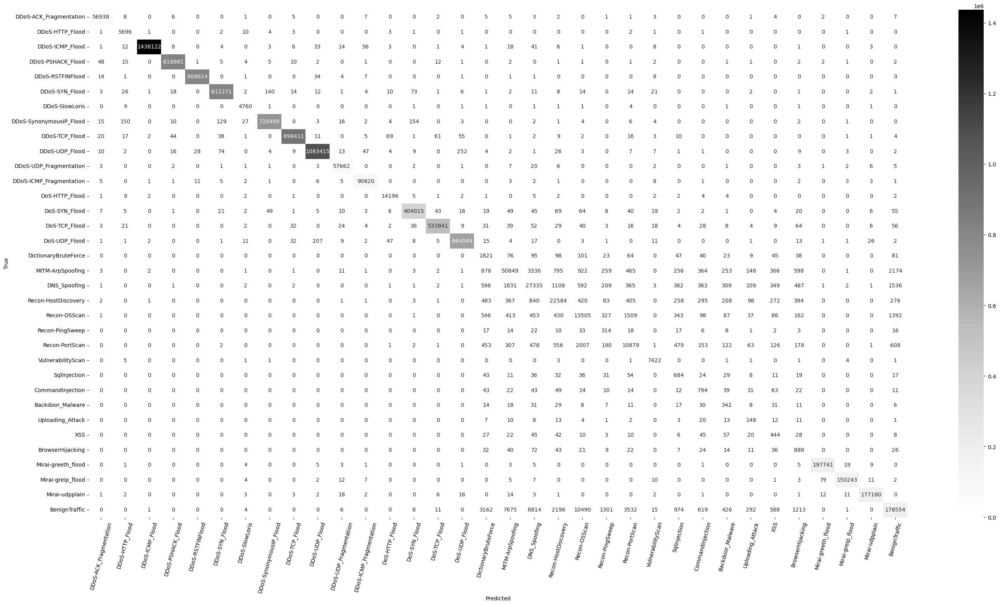

In [20]:
plt.figure(figsize=(34, 17))  # Adjust the size according to your needs
sn.heatmap(cm, annot=True, fmt='d', cmap='Greys', cbar=True,
           xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=75)
plt.yticks(rotation=0)
plt.show()

In [34]:
def calculate_multiclass_brier_score(y_true, y_prob):
    """
    Calculate the Brier score for multiclass classification.

    Parameters:
    y_true (array-like): True labels.
    y_prob (array-like): Predicted probabilities for each class.

    Returns:
    float: Average Brier score.
    """
    brier_scores = []
    for cls in range(y_prob.shape[1]):  # Iterate over the number of classes
        y_true_binary = (y_true == cls).astype(int)
        y_prob_cls = y_prob[:, cls]
        brier_scores.append(metrics.brier_score_loss(y_true_binary, y_prob_cls))
    return np.mean(brier_scores)

In [22]:
# Calculate multiclass Brier score
y_prob = clf.predict_proba(X_test)
multiclass_brier_score = calculate_multiclass_brier_score(test_data['label'], y_prob)
print(f'Multiclass Brier score: {multiclass_brier_score:.4f}')

Multiclass Brier score: 0.0581


In [7]:
import xgboost

In [8]:
y_train = np.array(train_data['label'])-1
y_test = np.array(test_data['label'])-1

In [13]:
np.unique(y_train)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33],
      dtype=int64)

In [9]:
xgb_classifier = xgboost.XGBClassifier(max_depth=33, objective='multi:softmax', n_estimators=300)

In [10]:
xgb_model = xgb_classifier.fit(X_train, y_train)
xgb_predicted_values = xgb_model.predict(X_test)

In [12]:
print(classification_report(y_test , xgb_predicted_values,target_names=unique_classes))

                         precision    recall  f1-score   support

 DDoS-ACK_Fragmentation       1.00      1.00      1.00     57001
        DDoS-HTTP_Flood       0.98      0.99      0.99      5727
        DDoS-ICMP_Flood       1.00      1.00      1.00   1438346
      DDoS-PSHACK_Flood       1.00      1.00      1.00    819001
       DDoS-RSTFINFlood       1.00      1.00      1.00    808686
         DDoS-SYN_Flood       1.00      1.00      1.00    812659
         DDoS-SlowLoris       0.98      1.00      0.99      4783
DDoS-SynonymousIP_Flood       1.00      1.00      1.00    721032
         DDoS-TCP_Flood       1.00      1.00      1.00    898784
         DDoS-UDP_Flood       1.00      1.00      1.00   1083949
 DDoS-UDP_Fragmentation       1.00      1.00      1.00     57729
DDoS-ICMP_Fragmentation       1.00      1.00      1.00     90881
         DoS-HTTP_Flood       0.99      1.00      0.99     14241
          DoS-SYN_Flood       1.00      1.00      1.00    404587
          DoS-TCP_Flood 

In [13]:
print(metrics.accuracy_score(y_test, xgb_predicted_values))
print(metrics.precision_score(y_test, xgb_predicted_values, average='weighted'))
print(metrics.recall_score(y_test, xgb_predicted_values, average='weighted'))
print(metrics.f1_score(y_test, xgb_predicted_values, average='weighted'))

0.9938886078183495
0.9947637215051138
0.9938886078183495
0.9941854843582446


In [14]:
xgb_cm = metrics.confusion_matrix(y_test, xgb_predicted_values)
len(xgb_cm)

34

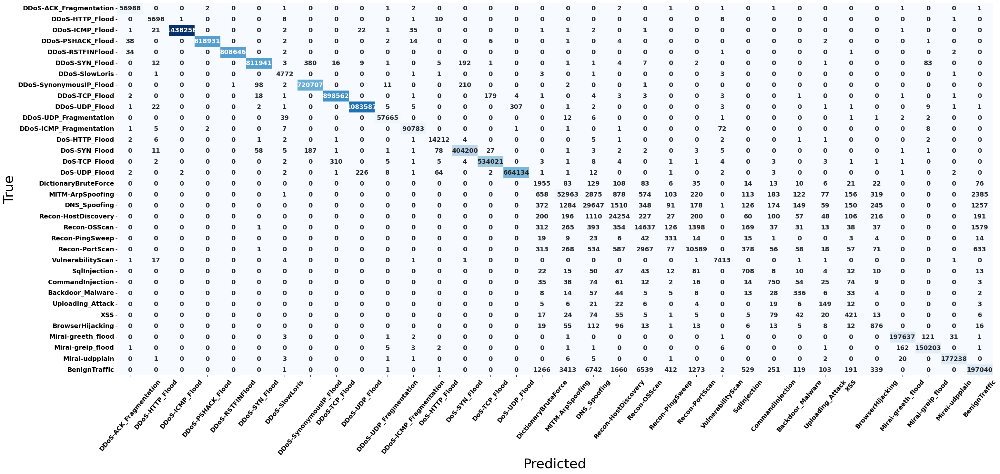

In [17]:
plt.figure(figsize=(35, 15))  # Adjust the size according to your needs
sn.heatmap(xgb_cm, annot=True, fmt='d', cmap='Blues', cbar=False,
           xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel("Predicted", fontsize=30)
plt.ylabel("True", fontsize=30)
plt.xticks(rotation=50)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 14,'font.weight':'bold'})
plt.show()

In [33]:
# Calculate multiclass Brier score
y_prob = xgb_model.predict_proba(X_test)

NameError: name 'calculate_multiclass_brier_score' is not defined

In [35]:
multiclass_brier_score = calculate_multiclass_brier_score(test_data['label'], y_prob)
print(f'Multiclass Brier score: {multiclass_brier_score:.4f}')

Multiclass Brier score: 0.0580


In [37]:
from sklearn.ensemble import RandomForestClassifier

In [38]:
rf_clf = RandomForestClassifier(max_depth=33, n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train+1)

RandomForestClassifier(max_depth=33, random_state=42)

In [39]:
rf_y_pred = rf_clf.predict(X_test)

In [40]:
print(classification_report(y_test+1 , rf_y_pred,target_names=unique_classes))

                         precision    recall  f1-score   support

 DDoS-ACK_Fragmentation       0.98      0.99      0.99     57001
        DDoS-HTTP_Flood       0.94      0.99      0.96      5727
        DDoS-ICMP_Flood       1.00      1.00      1.00   1438346
      DDoS-PSHACK_Flood       1.00      1.00      1.00    819001
       DDoS-RSTFINFlood       1.00      1.00      1.00    808686
         DDoS-SYN_Flood       1.00      1.00      1.00    812659
         DDoS-SlowLoris       0.67      1.00      0.80      4783
DDoS-SynonymousIP_Flood       1.00      1.00      1.00    721032
         DDoS-TCP_Flood       1.00      1.00      1.00    898784
         DDoS-UDP_Flood       1.00      1.00      1.00   1083949
 DDoS-UDP_Fragmentation       0.98      0.99      0.99     57729
DDoS-ICMP_Fragmentation       0.99      0.99      0.99     90881
         DoS-HTTP_Flood       0.88      0.99      0.93     14241
          DoS-SYN_Flood       1.00      1.00      1.00    404587
          DoS-TCP_Flood 

In [41]:
# Calculate accuracy, precision, recall, and F1 score
accuracy = metrics.accuracy_score(y_test+1, rf_y_pred)
precision = metrics.precision_score(y_test+1, rf_y_pred, average='weighted')
recall = metrics.recall_score(y_test+1, rf_y_pred, average='weighted')
f1 = metrics.f1_score(y_test+1, rf_y_pred, average='weighted')

In [42]:
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

Accuracy: 0.9913115289233009
Precision: 0.9936677432581026
Recall: 0.9913115289233009
F1 Score: 0.9921818514871794


In [43]:
rf_cm = metrics.confusion_matrix(y_test+1, rf_y_pred)

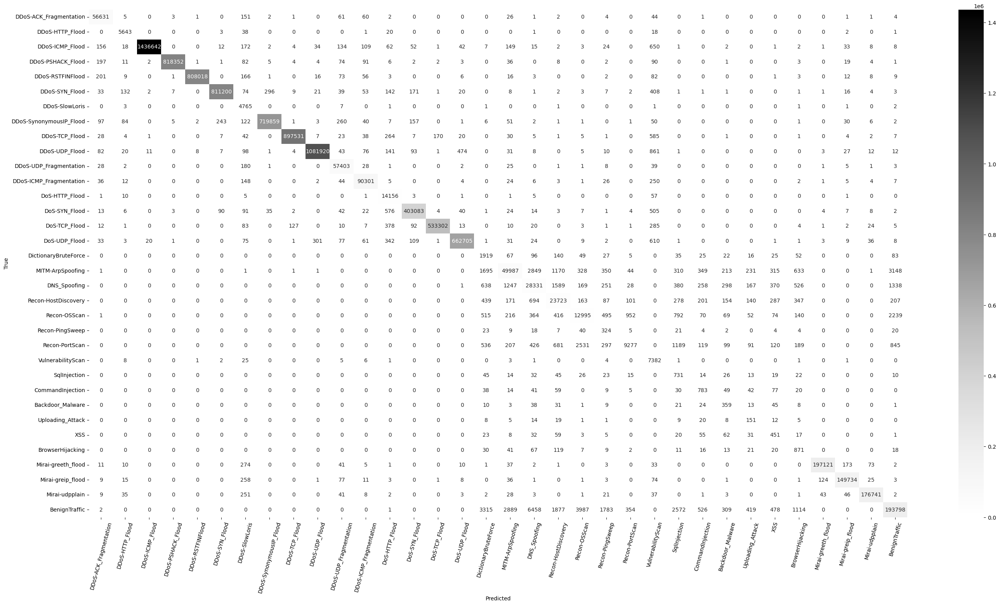

In [44]:
plt.figure(figsize=(34, 17))  # Adjust the size according to your needs
sn.heatmap(rf_cm, annot=True, fmt='d', cmap='Greys', cbar=True,
           xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=75)
plt.yticks(rotation=0)
plt.show()

In [45]:
# Calculate multiclass Brier score
y_prob = rf_clf.predict_proba(X_test)
multiclass_brier_score = calculate_multiclass_brier_score(y_test+1, y_prob)
print(f'Multiclass Brier score: {multiclass_brier_score:.4f}')

Multiclass Brier score: 0.0569


In [ ]:
#                          precision    recall  f1-score   support

#  DDoS-ACK_Fragmentation       1.00      1.00      1.00     57001
#         DDoS-HTTP_Flood       0.98      0.99      0.99      5727
#         DDoS-ICMP_Flood       1.00      1.00      1.00   1438346
#       DDoS-PSHACK_Flood       1.00      1.00      1.00    819001
#        DDoS-RSTFINFlood       1.00      1.00      1.00    808686
#          DDoS-SYN_Flood       1.00      1.00      1.00    812659
#          DDoS-SlowLoris       0.98      1.00      0.99      4783
# DDoS-SynonymousIP_Flood       1.00      1.00      1.00    721032
#          DDoS-TCP_Flood       1.00      1.00      1.00    898784
#          DDoS-UDP_Flood       1.00      1.00      1.00   1083949
#  DDoS-UDP_Fragmentation       1.00      1.00      1.00     57729
# DDoS-ICMP_Fragmentation       1.00      1.00      1.00     90881
#          DoS-HTTP_Flood       0.99      1.00      0.99     14241
#           DoS-SYN_Flood       1.00      1.00      1.00    404587
#           DoS-TCP_Flood       1.00      1.00      1.00    534381
#           DoS-UDP_Flood       1.00      1.00      1.00    664465
#    DictionaryBruteForce       0.36      0.76      0.49      2561
#        MITM-ArpSpoofing       0.90      0.86      0.88     61627
#            DNS_Spoofing       0.70      0.83      0.76     35591
#     Recon-HostDiscovery       0.81      0.89      0.85     26992
#            Recon-OSScan       0.57      0.75      0.65     19390
#         Recon-PingSweep       0.25      0.69      0.37       481
#          Recon-PortScan       0.76      0.64      0.69     16607
#       VulnerabilityScan       0.98      1.00      0.99      7441
#            SqlInjection       0.31      0.68      0.42      1035
#        CommandInjection       0.42      0.64      0.51      1167
#        Backdoor_Malware       0.33      0.60      0.42       563
#        Uploading_Attack       0.25      0.59      0.35       253
#                     XSS       0.31      0.55      0.40       767
#        BrowserHijacking       0.39      0.70      0.50      1245
#      Mirai-greeth_flood       1.00      1.00      1.00    197798
#       Mirai-greip_flood       1.00      1.00      1.00    150386
#          Mirai-udpplain       1.00      1.00      1.00    177278
#           BenignTraffic       0.97      0.89      0.93    219882

#                accuracy                           0.99   9337316
#               macro avg       0.80      0.88      0.83   9337316
#            weighted avg       0.99      0.99      0.99   9337316


In [43]:
import shap
shap.plots.initjs()

In [37]:
rng = np.random.default_rng()

In [39]:
# Identify false positives for a specific class
specific_class = 16
true_positives_indices_16 = np.where((y_test == specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(true_positives_indices_16))
X_true_positives_16 = rng.choice(X_test[true_positives_indices_16], min(10000,len(true_positives_indices_16)))

1955


In [40]:
tp_16_explainer = shap.TreeExplainer(xgb_classifier)
tp_16_shap_values = tp_16_explainer(X_true_positives_16,check_additivity=False)

[17:28:44] WARNING: C:\b\abs_0fh_d4x2ng\croot\xgboost-split_1713973188995\work\cpp_src\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


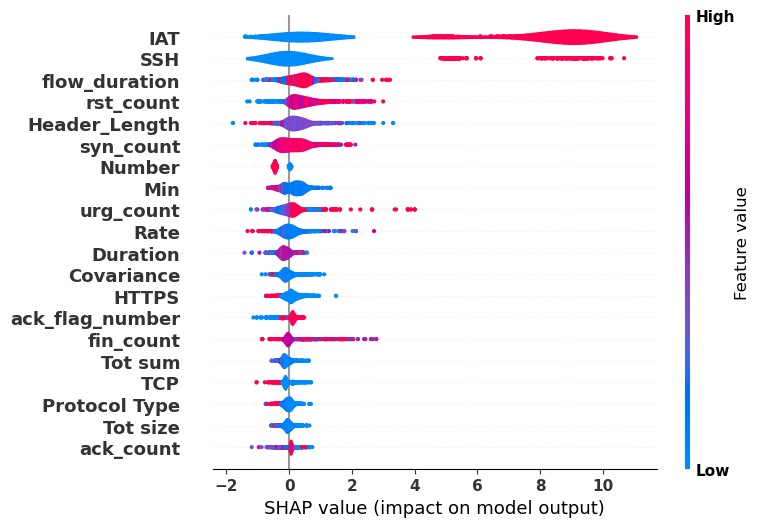

In [41]:
shap.summary_plot(tp_16_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

In [44]:
shap.plots.force(tp_16_shap_values[:, :, specific_class])

In [46]:
# Identify false negatives for a specific class
specific_class = 33
true_negatives_indices_33 = np.where((y_test == specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(true_negatives_indices_33))
X_true_negatives_33 = rng.choice(X_test[true_negatives_indices_33], min(1000,len(true_negatives_indices_33)))

197040


In [47]:
tp_33_explainer = shap.TreeExplainer(xgb_classifier)
tp_33_shap_values = tp_33_explainer(X_true_negatives_33,check_additivity=False)

[17:46:25] WARNING: C:\b\abs_0fh_d4x2ng\croot\xgboost-split_1713973188995\work\cpp_src\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


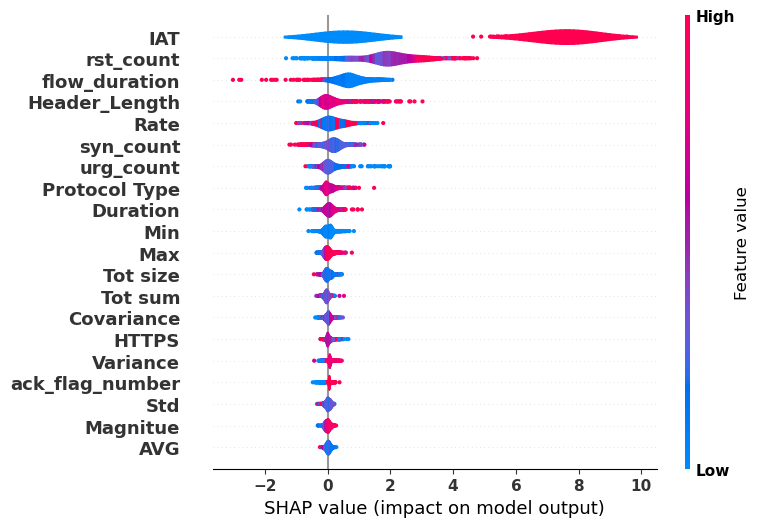

In [48]:
shap.summary_plot(tp_33_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

In [54]:
p = shap.plots.force(tp_33_shap_values[:1000, :, specific_class],link="logit")
shap.save_html('33_TN_force_plot.html', p)

In [48]:
explainer = shap.TreeExplainer(xgb_classifier)
shap_values = explainer(X_test[:1000],check_additivity=False)

[19:22:17] WARNING: C:\b\abs_0fh_d4x2ng\croot\xgboost-split_1713973188995\work\cpp_src\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


In [49]:
shap_values.feature_names = train_data.columns[:-1]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


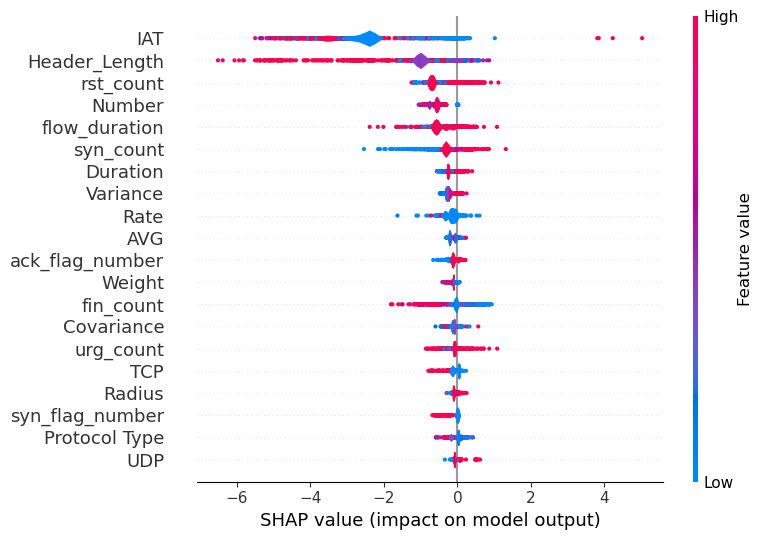

In [52]:
shap.summary_plot(shap_values[:, :, 16], plot_type="violin", class_names=unique_classes, plot_size=0.2)

3402


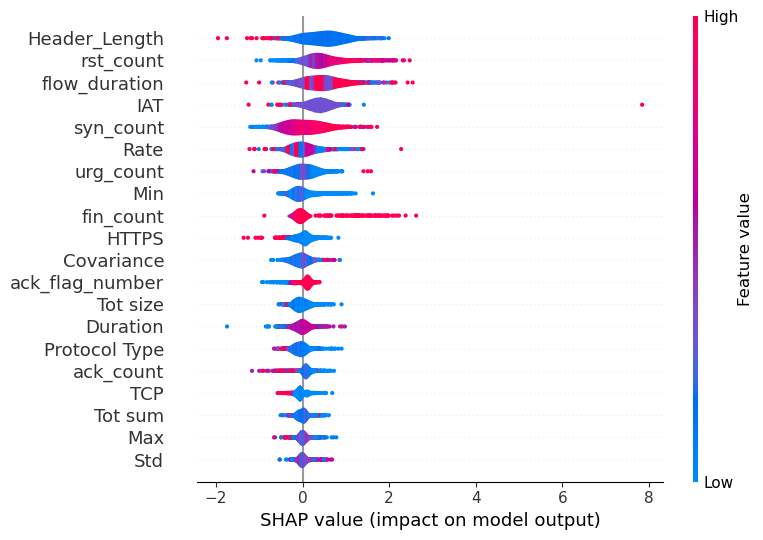

In [54]:
# Identify false positives for a specific class
specific_class = 16
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

616


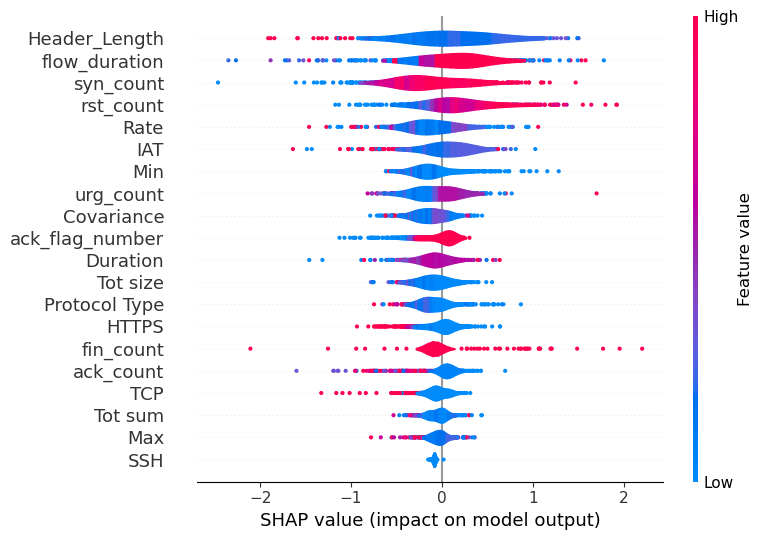

In [55]:
# Identify false negatives for a specific class
specific_class = 16
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

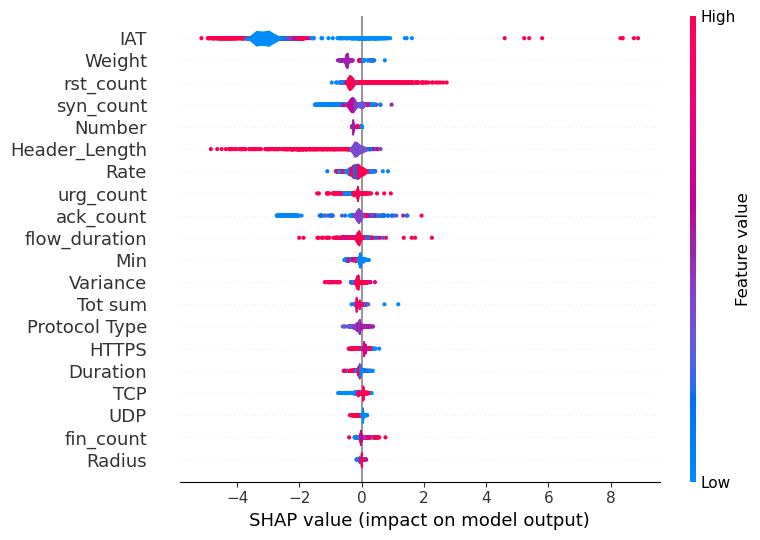

In [56]:
shap.summary_plot(shap_values[:, :, 20], plot_type="violin", class_names=unique_classes, plot_size=0.2)

10935


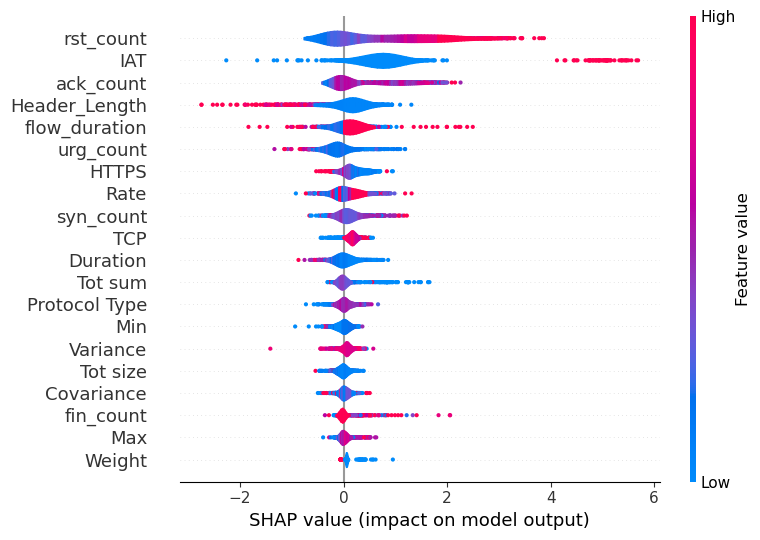

In [57]:
# Identify false positives for a specific class
specific_class = 20
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

4839


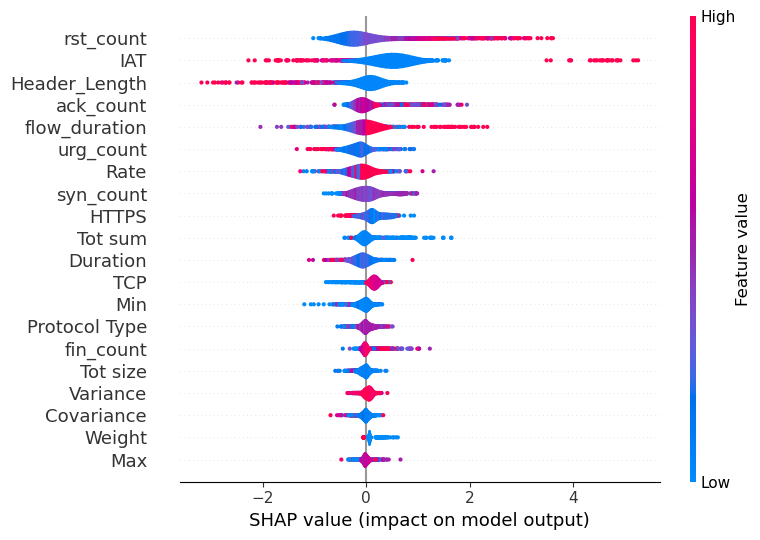

In [58]:
# Identify false negatives for a specific class
specific_class = 20
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

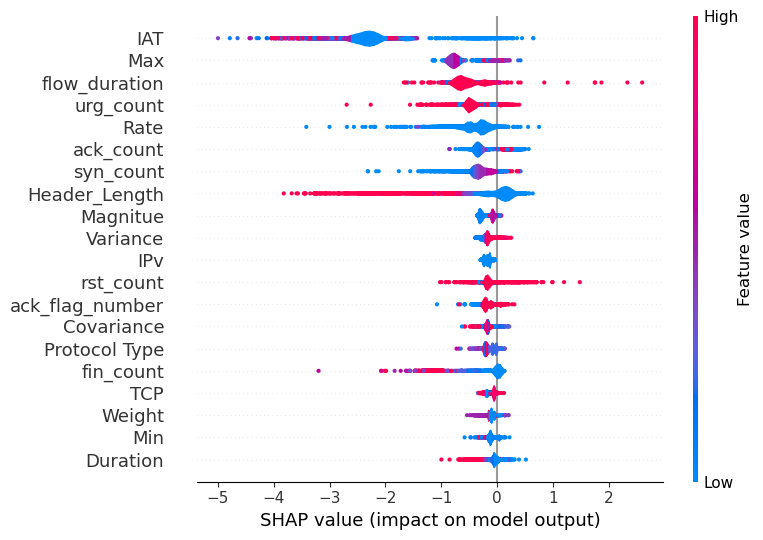

In [59]:
shap.summary_plot(shap_values[:, :, 21], plot_type="violin", class_names=unique_classes, plot_size=0.2)

987


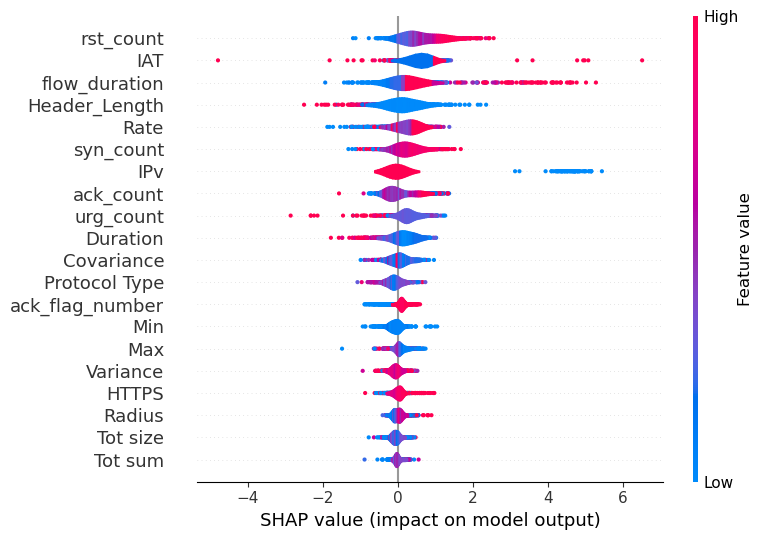

In [60]:
# Identify false positives for a specific class
specific_class = 21
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

150


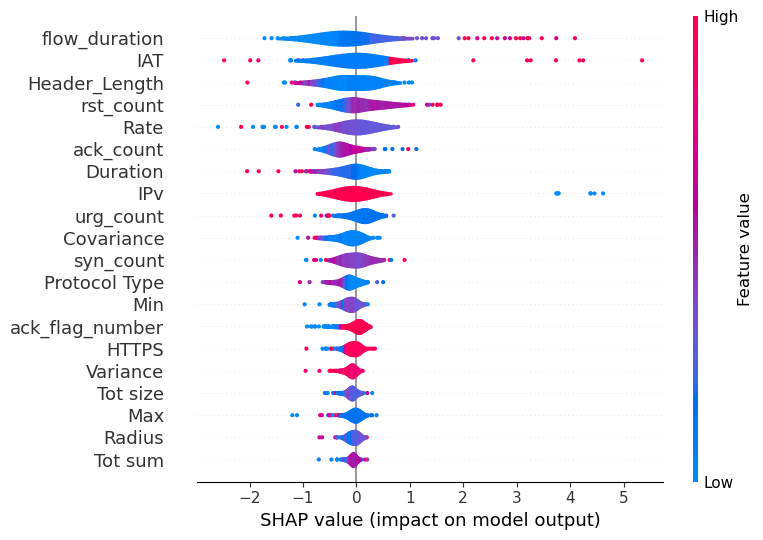

In [61]:
# Identify false negatives for a specific class
specific_class = 21
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

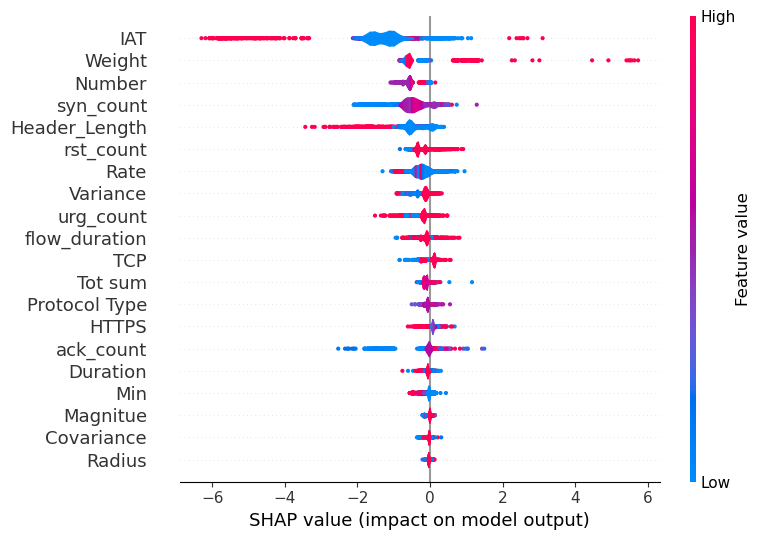

In [62]:
shap.summary_plot(shap_values[:, :, 22], plot_type="violin", class_names=unique_classes, plot_size=0.2)

3390


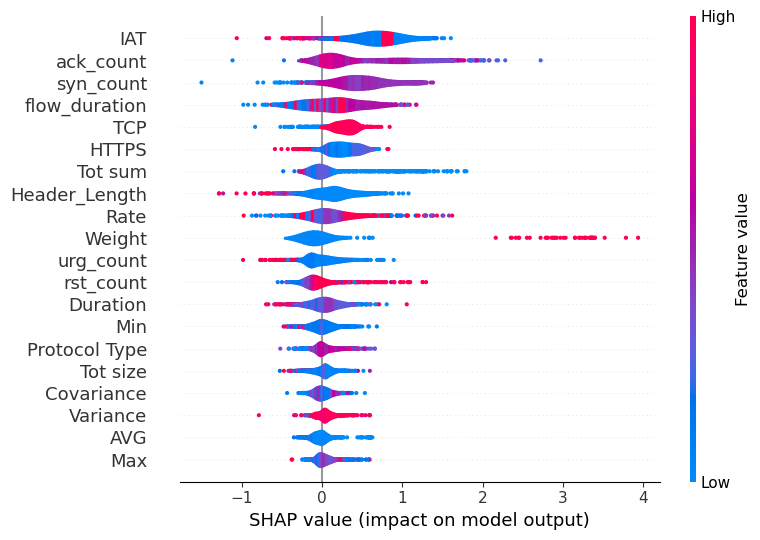

In [63]:
# Identify false positives for a specific class
specific_class = 22
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

6049


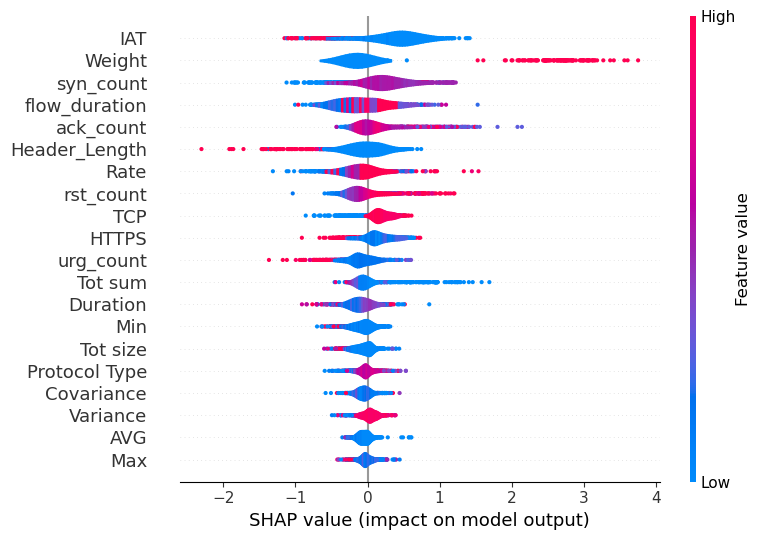

In [64]:
# Identify false negatives for a specific class
specific_class = 22
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

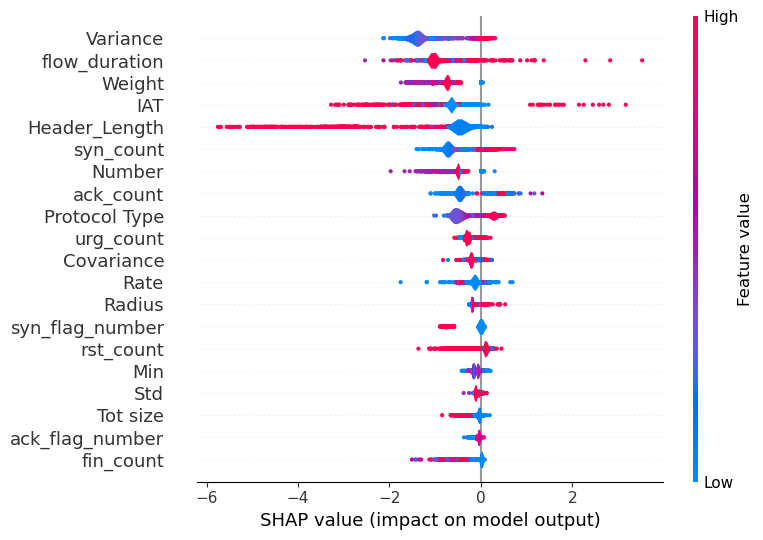

In [65]:
shap.summary_plot(shap_values[:, :, 24], plot_type="violin", class_names=unique_classes, plot_size=0.2)

1582


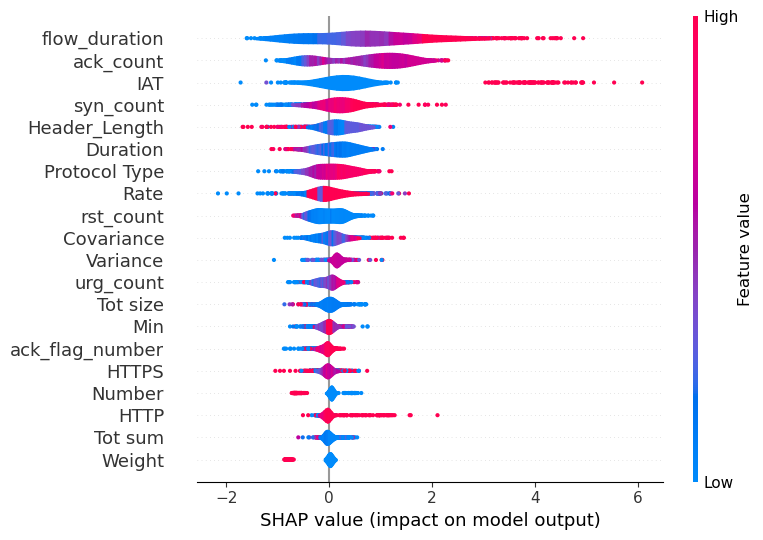

In [66]:
# Identify false positives for a specific class
specific_class = 24
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

331


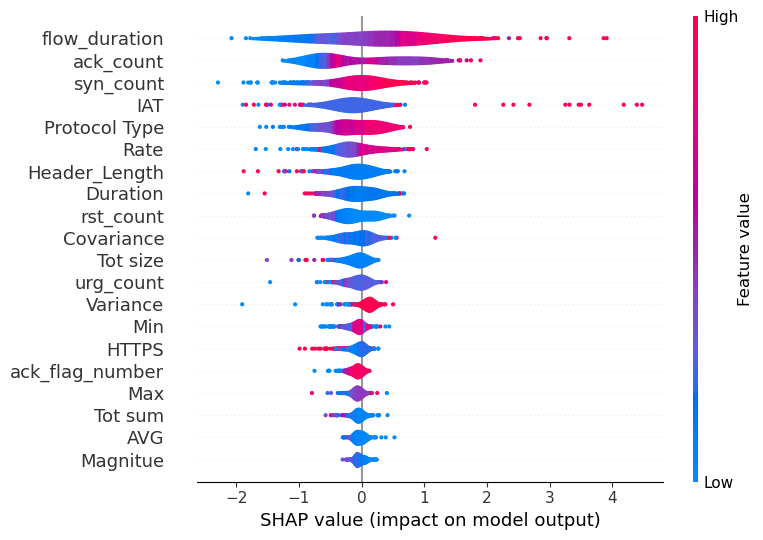

In [67]:
# Identify false negatives for a specific class
specific_class = 24
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

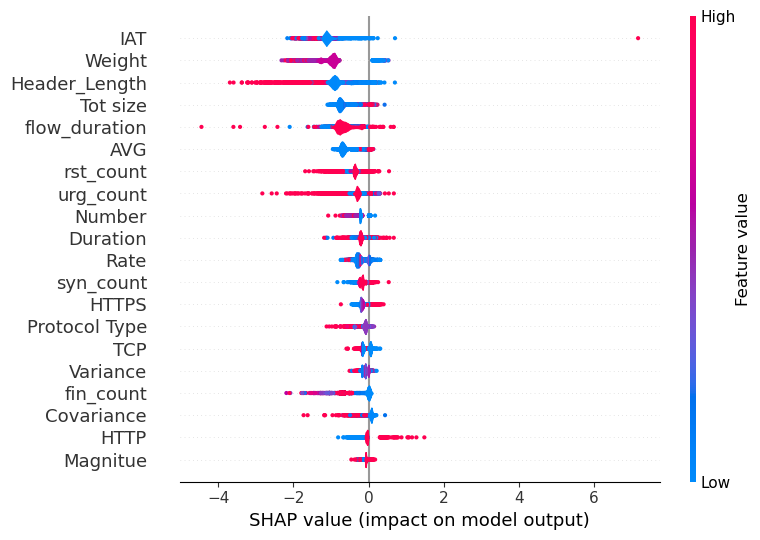

In [68]:
shap.summary_plot(shap_values[:, :, 25], plot_type="violin", class_names=unique_classes, plot_size=0.2)

1028


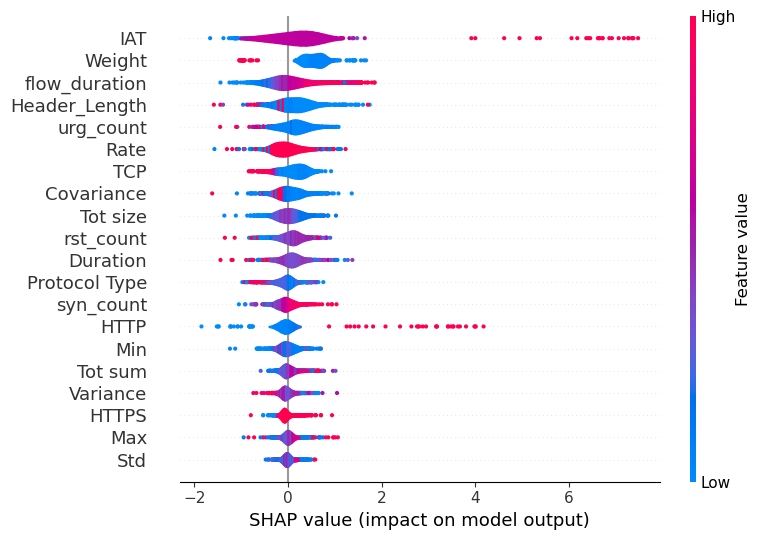

In [69]:
# Identify false positives for a specific class
specific_class = 25
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

418


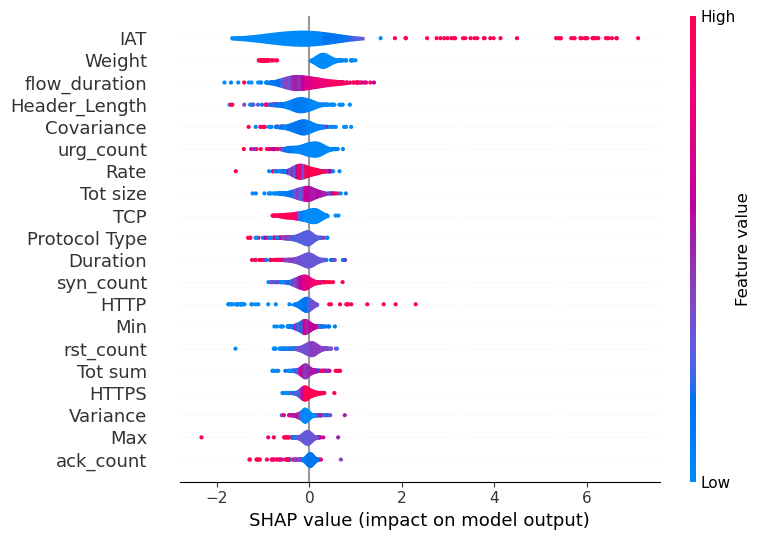

In [70]:
# Identify false negatives for a specific class
specific_class = 25
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

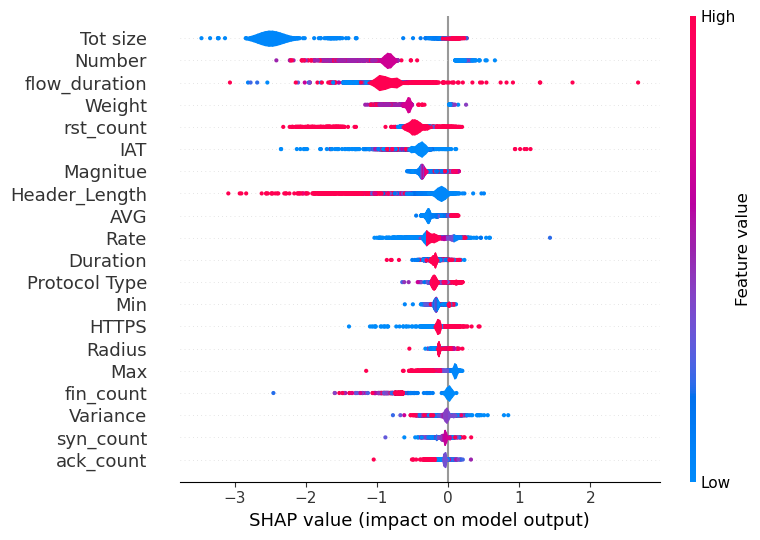

In [71]:
shap.summary_plot(shap_values[:, :, 26], plot_type="violin", class_names=unique_classes, plot_size=0.2)

694


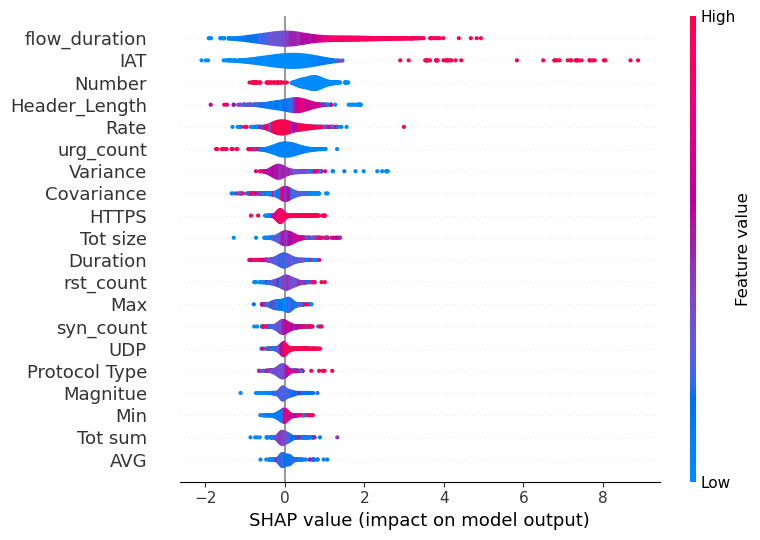

In [72]:
# Identify false positives for a specific class
specific_class = 26
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

227


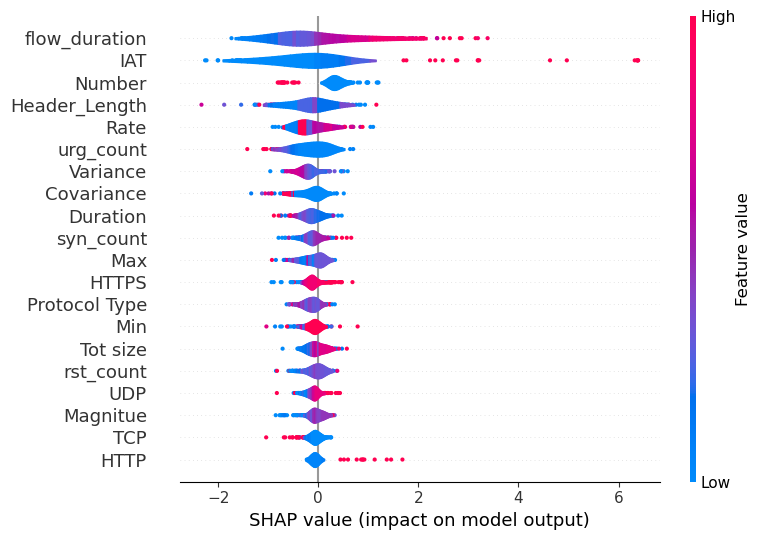

In [73]:
# Identify false negatives for a specific class
specific_class = 26
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

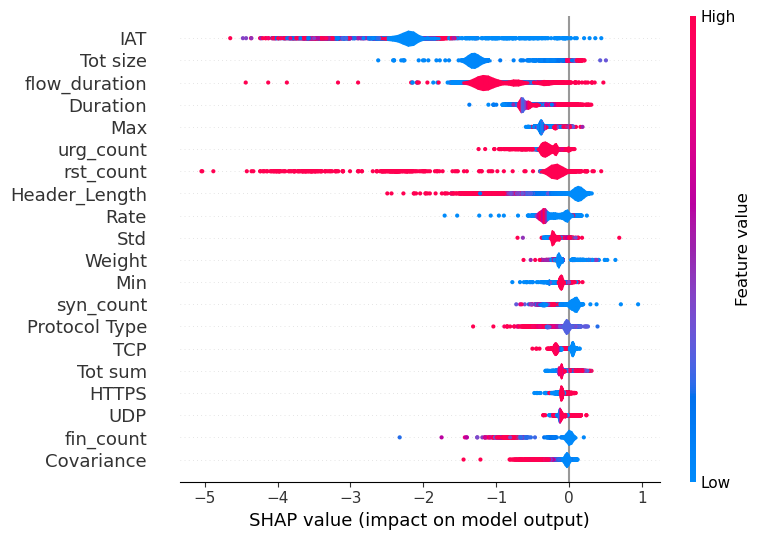

In [74]:
shap.summary_plot(shap_values[:, :, 27], plot_type="violin", class_names=unique_classes, plot_size=0.2)

439


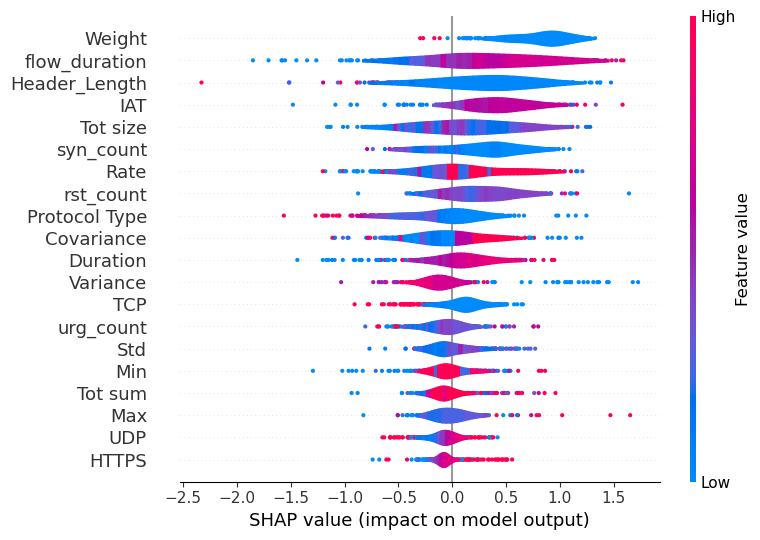

In [75]:
# Identify false positives for a specific class
specific_class = 27
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

104


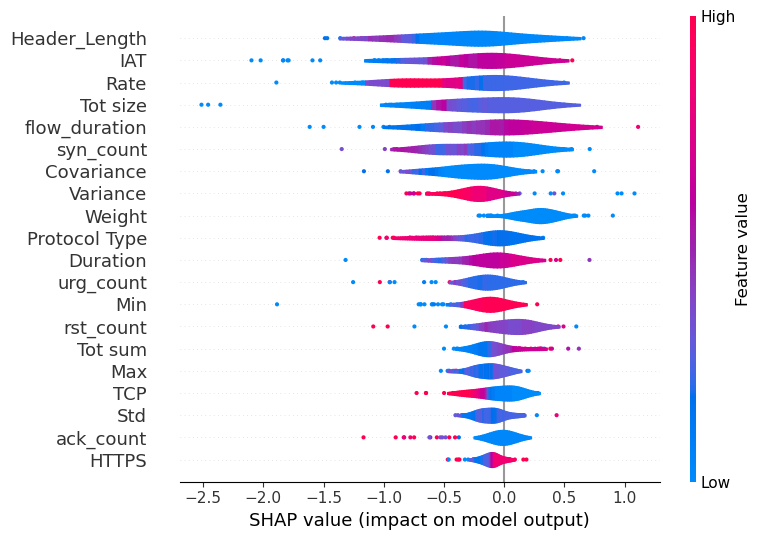

In [76]:
# Identify false negatives for a specific class
specific_class = 27
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

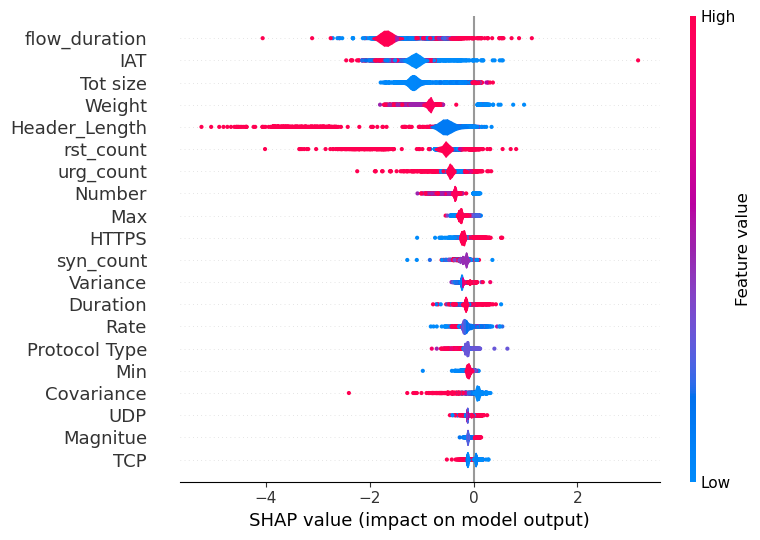

In [77]:
shap.summary_plot(shap_values[:, :, 28], plot_type="violin", class_names=unique_classes, plot_size=0.2)

915


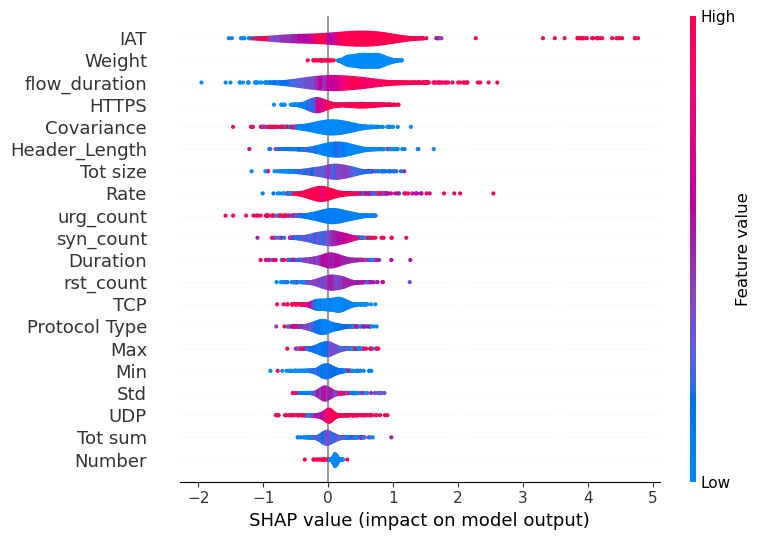

In [78]:
# Identify false positives for a specific class
specific_class = 28
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

347


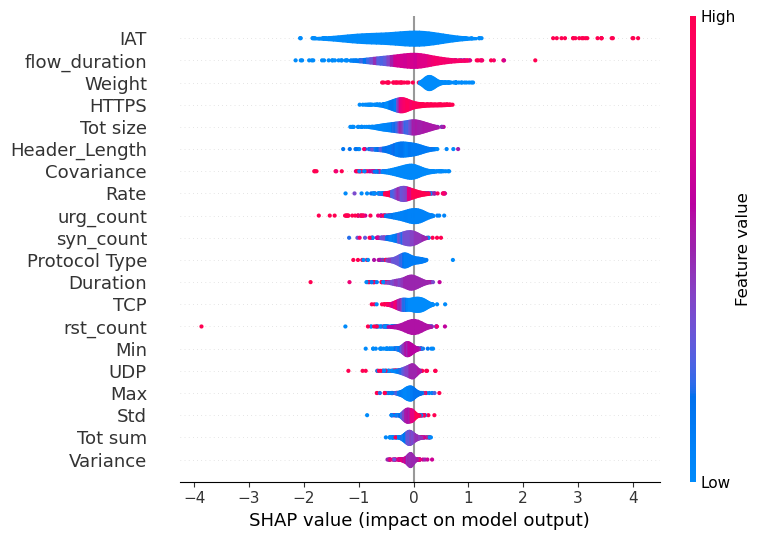

In [79]:
# Identify false negatives for a specific class
specific_class = 28
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

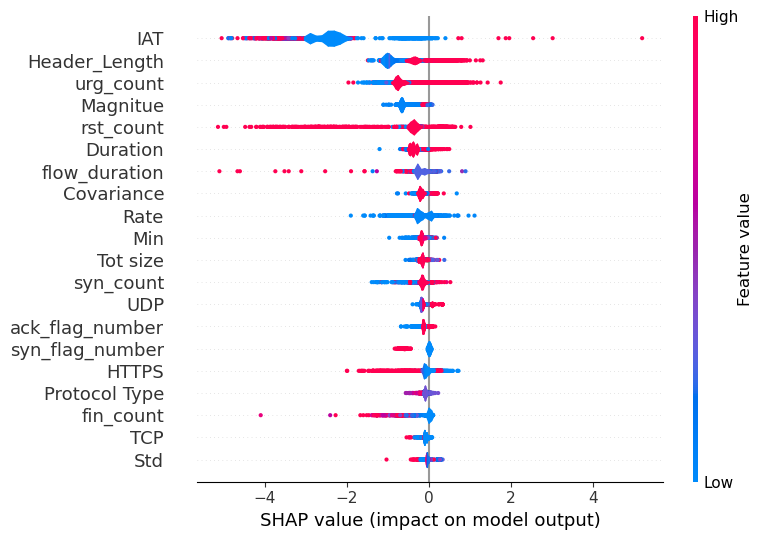

In [80]:
shap.summary_plot(shap_values[:, :, 29], plot_type="violin", class_names=unique_classes, plot_size=0.2)

1380


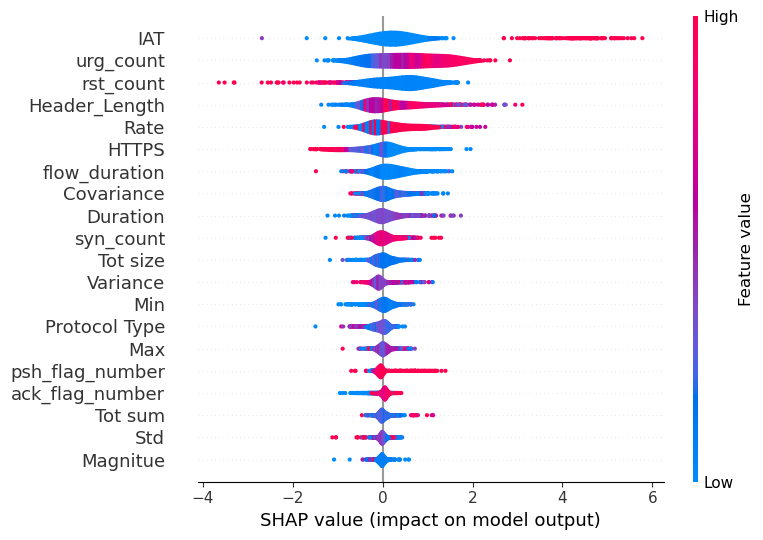

In [81]:
# Identify false positives for a specific class
specific_class = 29
false_positives_indices = np.where((y_test != specific_class) & (xgb_predicted_values == specific_class))[0]
print(len(false_positives_indices))
X_false_positives = X_test[false_positives_indices]
# len(X_false_positives)
fp_0_shap_values = explainer(X_false_positives[:min(len(X_false_positives),1000)],check_additivity=False)
shap.summary_plot(fp_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)

379


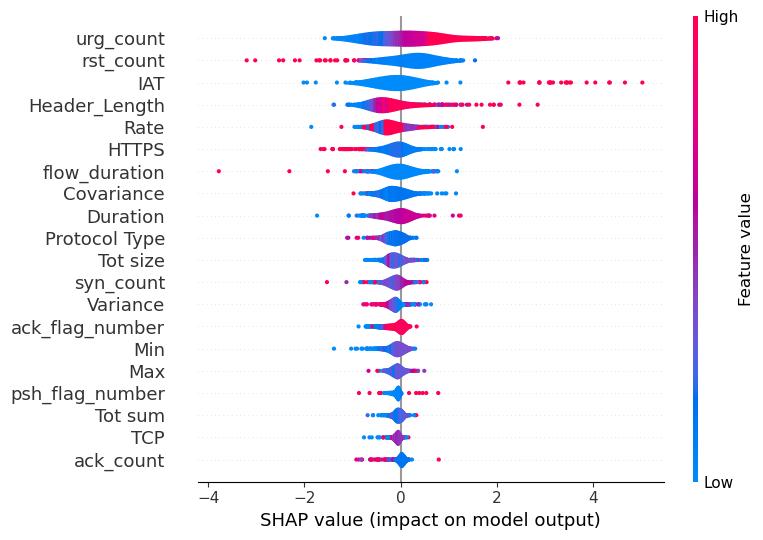

In [82]:
# Identify false negatives for a specific class
specific_class = 29
false_negatives_indices = np.where((y_test == specific_class) & (xgb_predicted_values != specific_class))[0]
print(len(false_negatives_indices))
X_false_negatives = X_test[false_negatives_indices]
# len(X_false_negatives)
fn_0_shap_values = explainer(X_false_negatives[:min(len(X_false_negatives),1000)],check_additivity=False)
shap.summary_plot(fn_0_shap_values[:, :, specific_class], plot_type="violin", feature_names = train_data.columns[:-1], class_names=unique_classes, plot_size=0.2)